In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage

# Фото 1
## Перетворення зображення

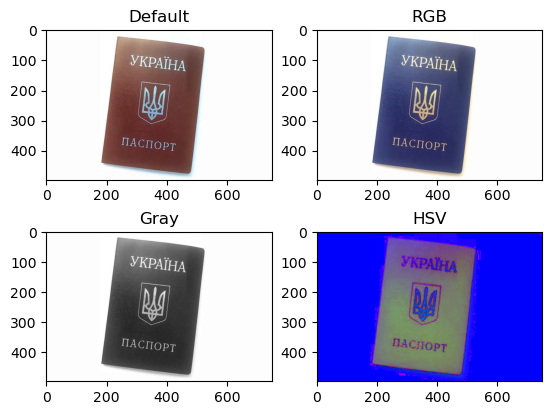

In [2]:
passportUA=cv2.imread('passportua.jpg')
rgb_passportUA = cv2.cvtColor(passportUA, cv2.COLOR_BGR2RGB)
gray_passportUA = cv2.cvtColor(passportUA, cv2.COLOR_BGR2GRAY)
hsv_passportUA = cv2.cvtColor(passportUA, cv2.COLOR_BGR2HSV)
plt.subplot(2,2,1)
plt.title('Default')
plt.imshow(passportUA)
plt.subplot(2,2,2)
plt.title('RGB')
plt.imshow(rgb_passportUA)
plt.subplot(2,2,3)
plt.title('Gray')
plt.imshow(gray_passportUA, cmap='gray')
plt.subplot(2,2,4)
plt.title('HSV')
plt.imshow(hsv_passportUA)

## Гістограма зображення

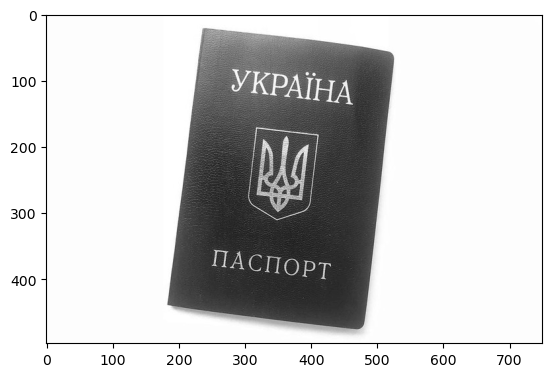

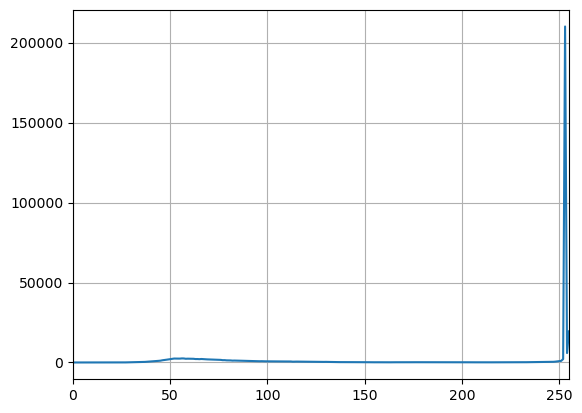

In [3]:
passportUA = cv2.imread('passportua.jpg',cv2.IMREAD_GRAYSCALE)
plt.imshow(passportUA, cmap='gray')
plt.show()
hist = cv2.calcHist([passportUA], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

## Вирівнювання гістограми 

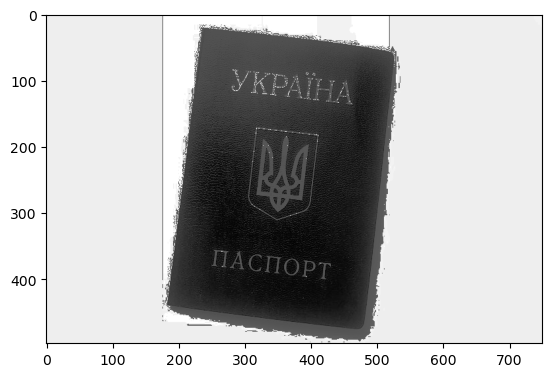

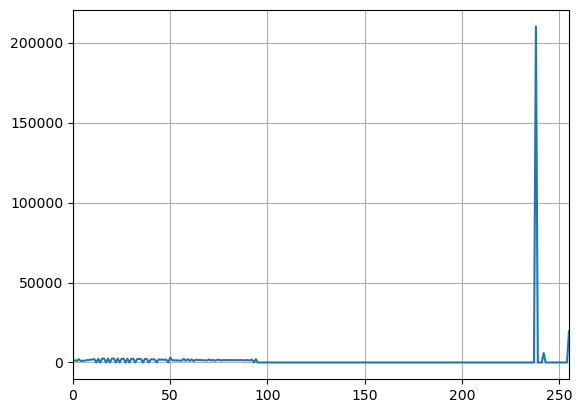

In [4]:
equ = cv2.equalizeHist(passportUA)
plt.imshow(equ,cmap='gray')
plt.show()
hist = cv2.calcHist([equ], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

## Розмір зображення

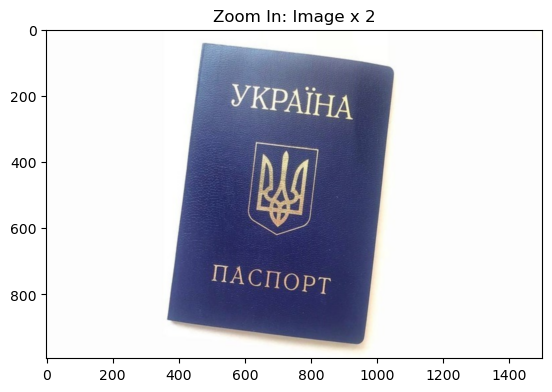

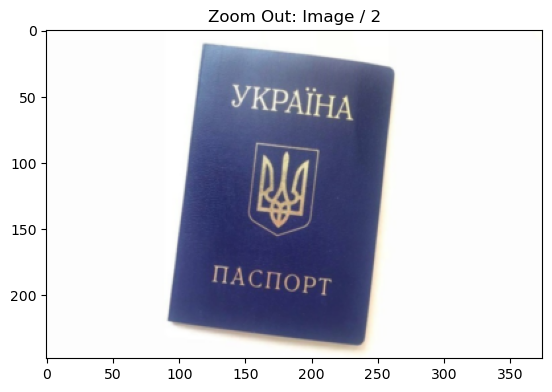

In [5]:
rows, cols = map(int, passportUA.shape)

passportUA_size = cv2.pyrUp(rgb_passportUA, dstsize=(2 * cols, 2 * rows))
plt.imshow(passportUA_size)
plt.title('Zoom In: Image x 2')
plt.show()

passportUA_size = cv2.pyrDown(rgb_passportUA, dstsize=(cols // 2, rows // 2))
plt.imshow(passportUA_size)
plt.title('Zoom Out: Image / 2')
plt.show()

## Гаусове згладжування 

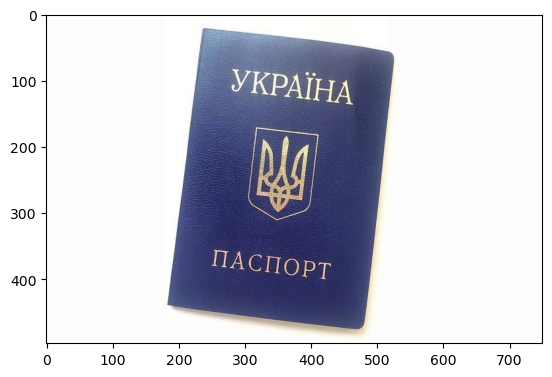

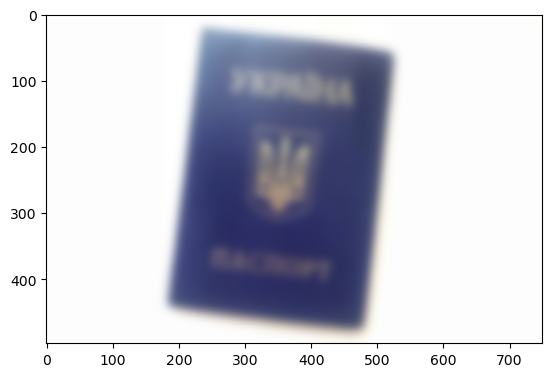

In [6]:
passportUA_blur = cv2.GaussianBlur(rgb_passportUA,(45,45),0)
plt.imshow(rgb_passportUA)
plt.show()
plt.imshow(passportUA_blur)
plt.show() 

## Порогова обробка 

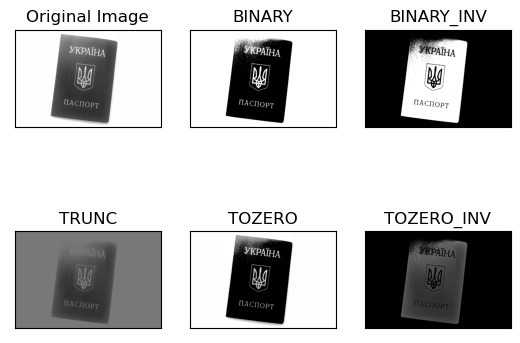

In [7]:
# applying different thresholding
# techniques on the input image
# all pixels value above 120 will
# be set to 255
ret, thresh1 = cv2.threshold(gray_passportUA, 120, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(gray_passportUA, 120, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(gray_passportUA, 120, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(gray_passportUA, 120, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(gray_passportUA, 120, 255, cv2.THRESH_TOZERO_INV)
 
# the window showing output images
# with the corresponding thresholding
# techniques applied to the input images
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [gray_passportUA, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

## Масштабування та афінне перетворення 

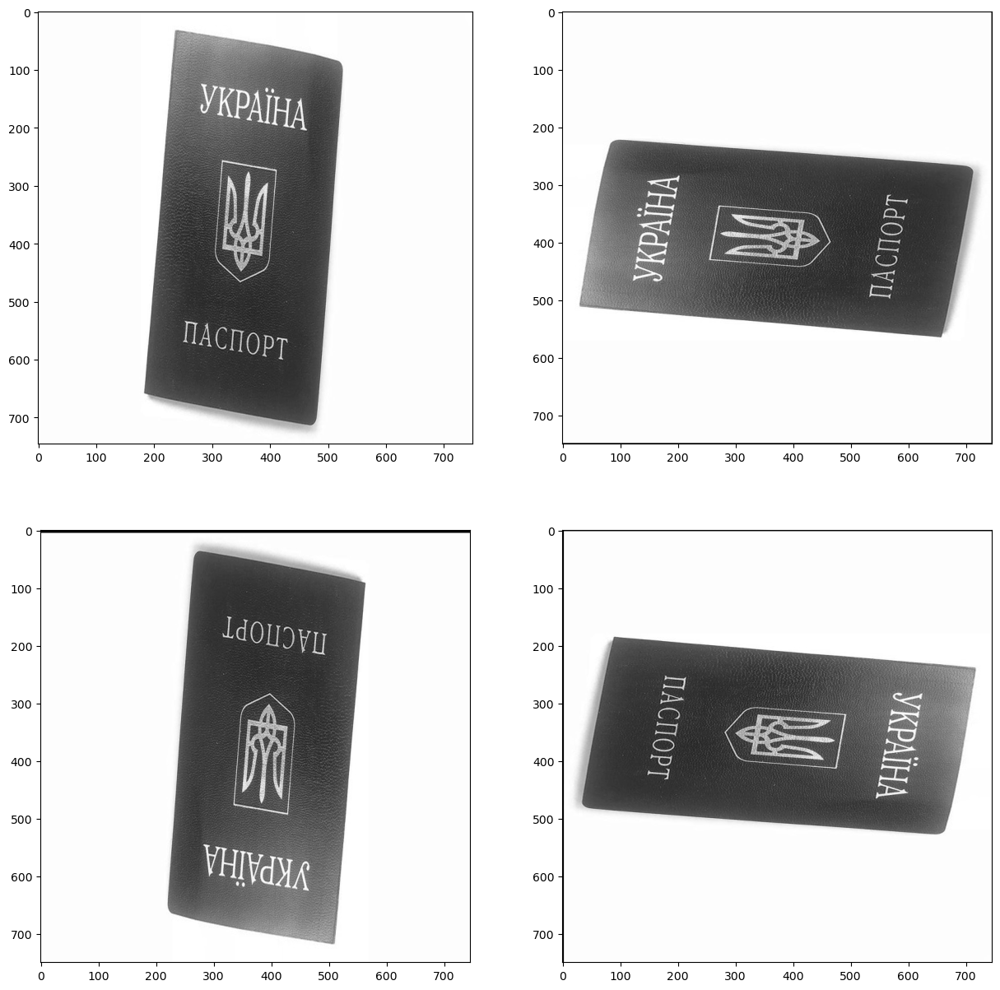

In [8]:
img = cv2.resize(passportUA,None,fx=1, fy=1.5, interpolation = cv2.INTER_CUBIC)
width=img.shape[0]
height=img.shape[1]
M90 = cv2.getRotationMatrix2D((width/2, height/2), 90, 1) 
M180 = cv2.getRotationMatrix2D((width/2, height/2), 180, 1) 
M270 = cv2.getRotationMatrix2D((width/2, height/2), 270, 1) 
img_rot90 = cv2.warpAffine(img, M90, (width, height)) 
img_rot180 = cv2.warpAffine(img, M180, (width, height)) 
img_rot270 = cv2.warpAffine(img, M270, (width, height)) 
plt.figure(figsize = (15, 15)) 
plt.subplot(221) 
plt.imshow(img, cmap='gray') 
plt.subplot(222) 
plt.imshow(img_rot90, cmap='gray') 
plt.subplot(223) 
plt.imshow(img_rot180, cmap='gray') 
plt.subplot(224) 
plt.imshow(img_rot270, cmap='gray') 
plt.show()

## Ерозія та дилація 

[[0 1]
 [1 1]]


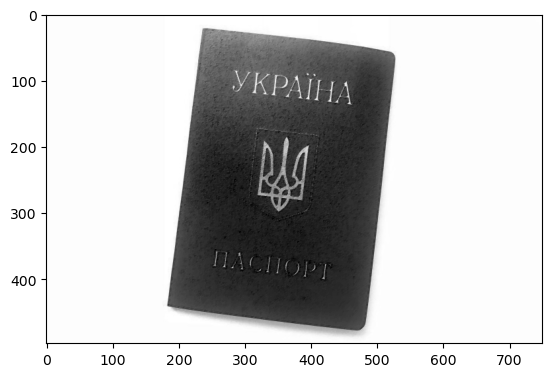

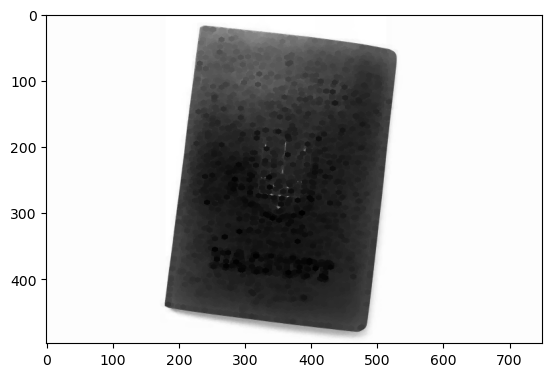

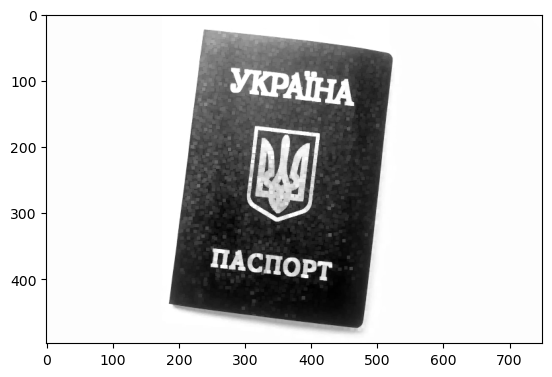

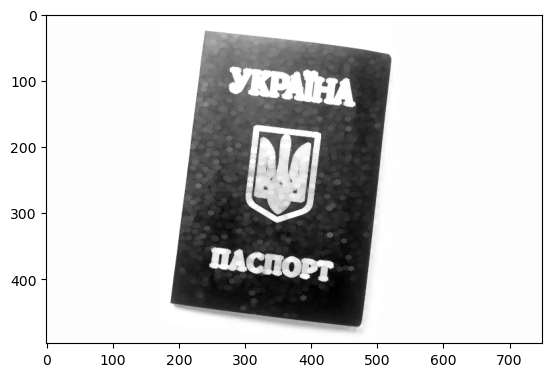

In [9]:
kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2))
print(kernel)
fig = passportUA
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

fig1 = cv2.erode(fig, kernel,iterations = 2)
fig2 = cv2.erode(fig, ellipse_kernel, iterations = 2)
fig3 = cv2.dilate(fig, rect_kernel,iterations = 2)
fig4= cv2.dilate(fig, ellipse_kernel, iterations = 2)


plt.imshow(fig1,cmap="gray")
plt.show()  
plt.imshow(fig2,cmap="gray")
plt.show()  
plt.imshow(fig3,cmap="gray")
plt.show() 
plt.imshow(fig4,cmap="gray")
plt.show()  

## Простори LoG та DoG 

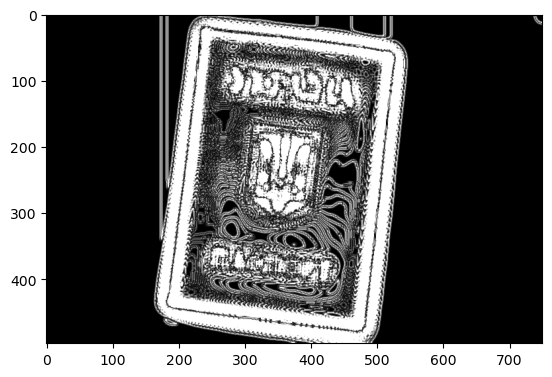

In [10]:
passportUA_blur = cv2.GaussianBlur(gray_passportUA,(45,45),0)
log = cv2.Laplacian(passportUA_blur,ddepth=cv2.CV_16S,ksize=7)
log = cv2.convertScaleAbs(log)
plt.imshow(log, cmap='gray')
plt.show()

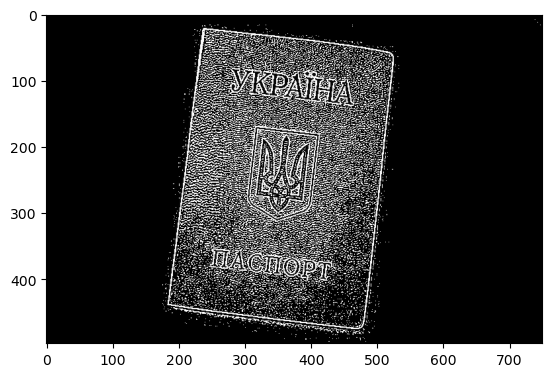

In [11]:
# Apply 3x3 and 7x7 Gaussian blur
low_sigma = cv2.GaussianBlur(gray_passportUA,(3,3),0)
high_sigma = cv2.GaussianBlur(gray_passportUA,(5,5),0)

# Calculate the DoG by subtracting
dog = low_sigma - high_sigma
plt.imshow(dog, cmap='gray')
plt.show()

# Фото 2
## Перетворення зображення

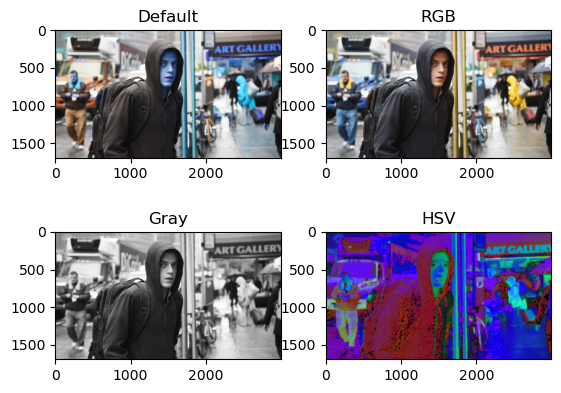

In [12]:
mrrobot=cv2.imread('mrrobot.webp')
rgb_mrrobot = cv2.cvtColor(mrrobot, cv2.COLOR_BGR2RGB)
gray_mrrobot = cv2.cvtColor(mrrobot, cv2.COLOR_BGR2GRAY)
hsv_mrrobot = cv2.cvtColor(mrrobot, cv2.COLOR_BGR2HSV)
plt.subplot(2,2,1)
plt.title('Default')
plt.imshow(mrrobot)
plt.subplot(2,2,2)
plt.title('RGB')
plt.imshow(rgb_mrrobot)
plt.subplot(2,2,3)
plt.title('Gray')
plt.imshow(gray_mrrobot, cmap='gray')
plt.subplot(2,2,4)
plt.title('HSV')
plt.imshow(hsv_mrrobot)

## Гістограма зображення

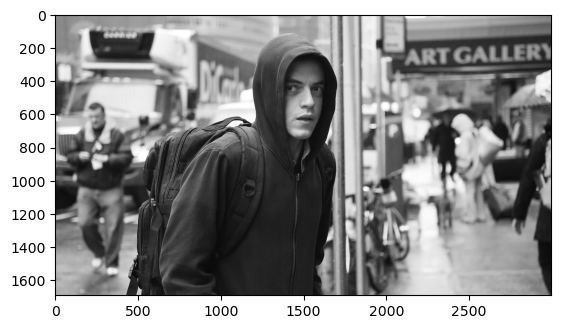

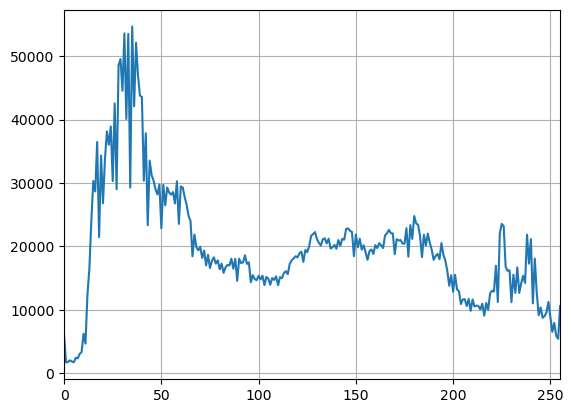

In [13]:
plt.imshow(gray_mrrobot, cmap='gray')
plt.show()
hist = cv2.calcHist([mrrobot], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

## Вирівнювання гістограми 

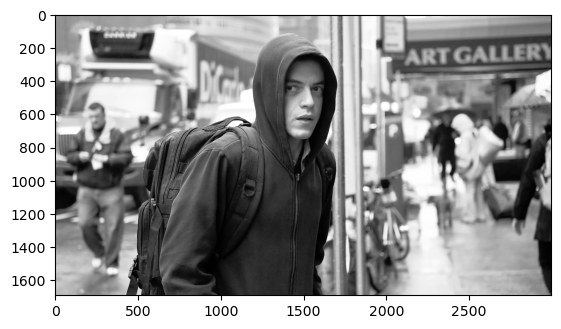

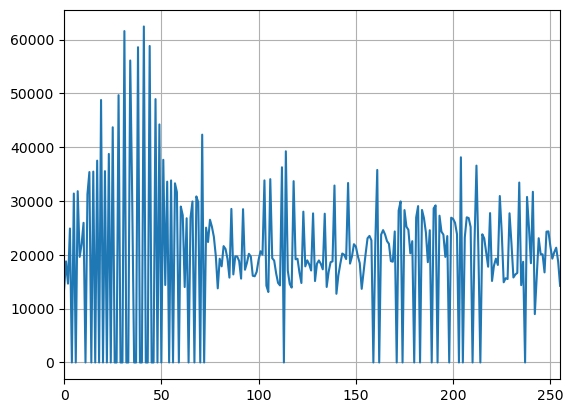

In [14]:
equ = cv2.equalizeHist(gray_mrrobot)
plt.imshow(equ,cmap='gray')
plt.show()
hist = cv2.calcHist([equ], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

##  Розмір зображення

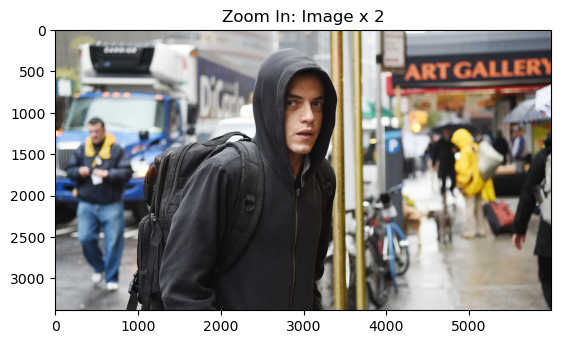

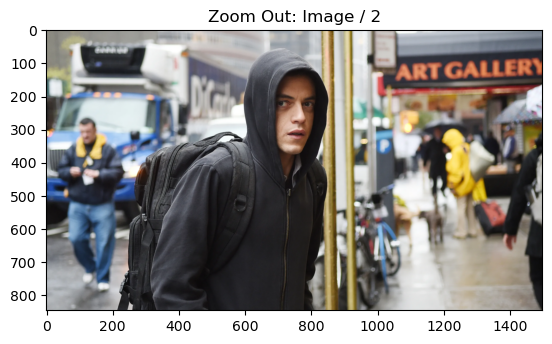

In [15]:
rows, cols, dot = map(int, mrrobot.shape)

mrrobot_size = cv2.pyrUp(rgb_mrrobot, dstsize=(2 * cols, 2 * rows))
plt.imshow(mrrobot_size)
plt.title('Zoom In: Image x 2')
plt.show()

mrrobot_size = cv2.pyrDown(rgb_mrrobot, dstsize=(cols // 2, rows // 2))
plt.imshow(mrrobot_size)
plt.title('Zoom Out: Image / 2')
plt.show()

## Гаусове згладжування 

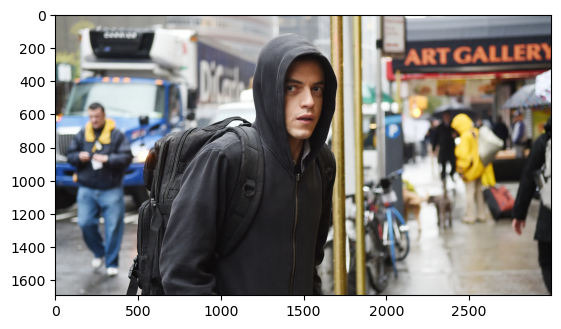

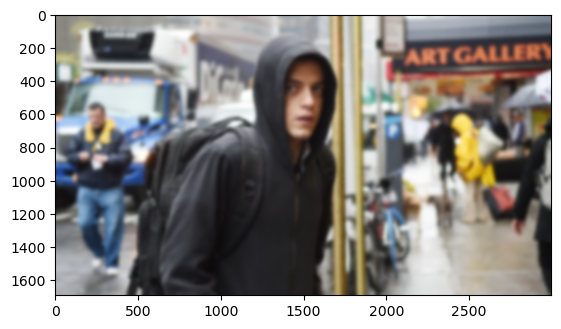

In [16]:
mrrobot_blur = cv2.GaussianBlur(rgb_mrrobot,(65,65),0)
plt.imshow(rgb_mrrobot)
plt.show()
plt.imshow(mrrobot_blur)
plt.show() 

## Порогова обробка 

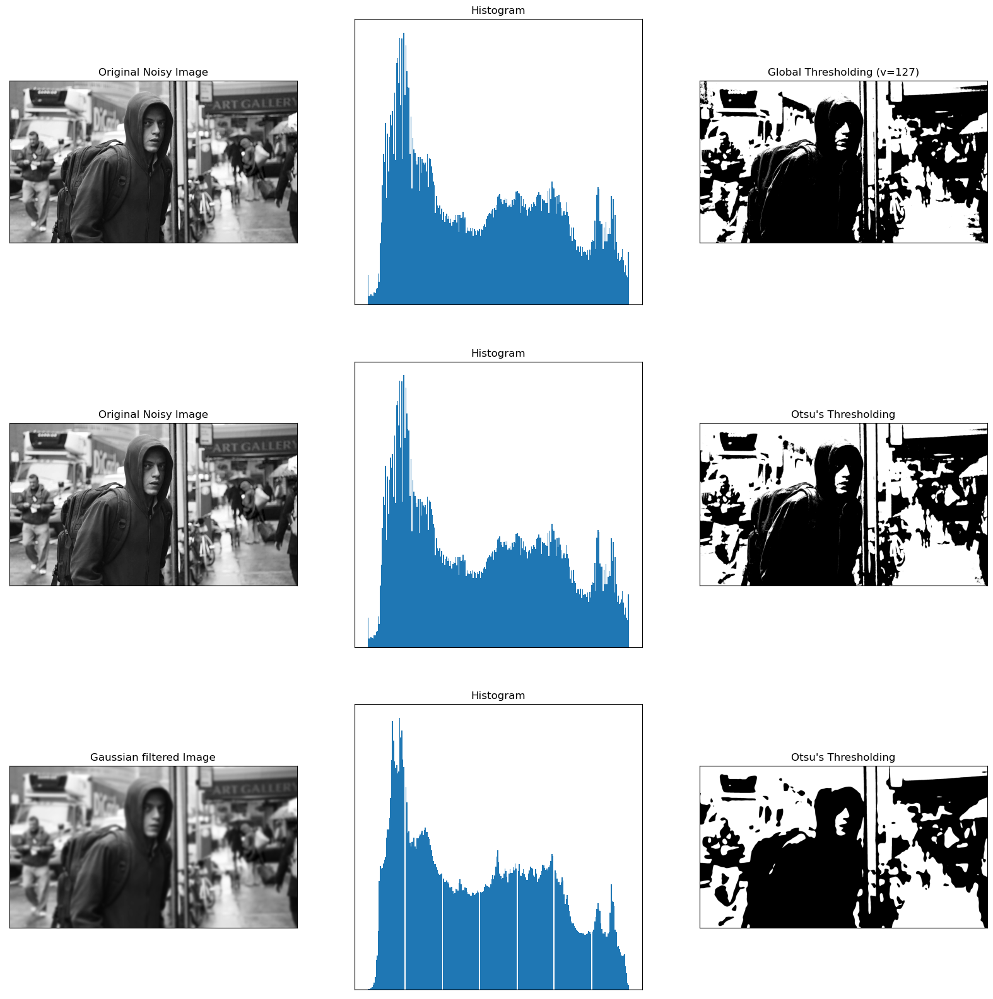

In [17]:
a, b, c = cv2.split(mrrobot)

# global thresholding
ret1,th1 = cv2.threshold(a,127,255,cv2.THRESH_BINARY)
# Otsu's thresholding
ret2,th2 = cv2.threshold(a,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(a,(65,65),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# plot all the images and their histograms
images = [a, 0, th1,
          a, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

plt.figure(figsize=(20,20))
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

## Масштабування та афінне перетворення 

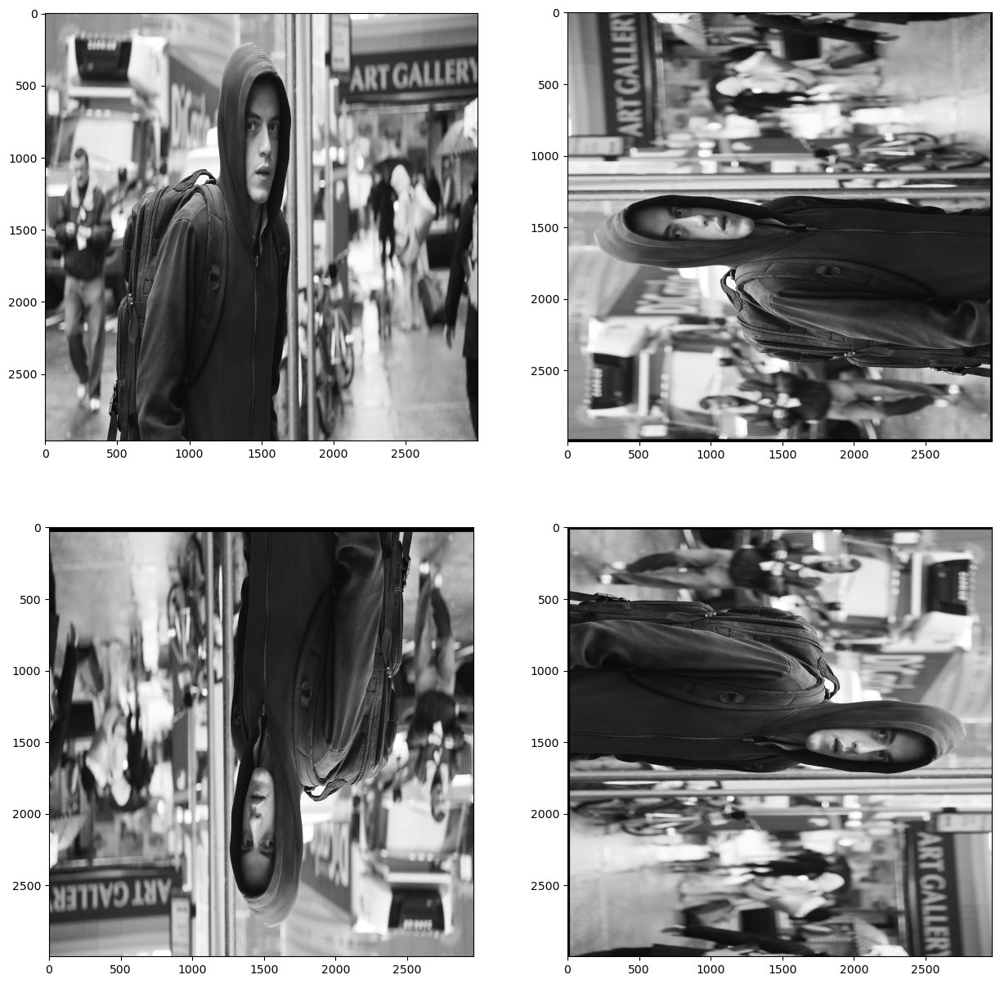

In [18]:
img = cv2.resize(gray_mrrobot,None,fx=1, fy=1.75, interpolation = cv2.INTER_CUBIC)
width=img.shape[0]
height=img.shape[1]
M90 = cv2.getRotationMatrix2D((width/2, height/2), 90, 1) 
M180 = cv2.getRotationMatrix2D((width/2, height/2), 180, 1) 
M270 = cv2.getRotationMatrix2D((width/2, height/2), 270, 1) 
img_rot90 = cv2.warpAffine(img, M90, (width, height)) 
img_rot180 = cv2.warpAffine(img, M180, (width, height)) 
img_rot270 = cv2.warpAffine(img, M270, (width, height)) 
plt.figure(figsize = (15, 15)) 
plt.subplot(221) 
plt.imshow(img, cmap='gray') 
plt.subplot(222) 
plt.imshow(img_rot90, cmap='gray') 
plt.subplot(223) 
plt.imshow(img_rot180, cmap='gray') 
plt.subplot(224) 
plt.imshow(img_rot270, cmap='gray') 
plt.show()

## Ерозія та дилація 

[[0 0 0 0 1 0 0 0 0]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [0 0 0 0 1 0 0 0 0]]


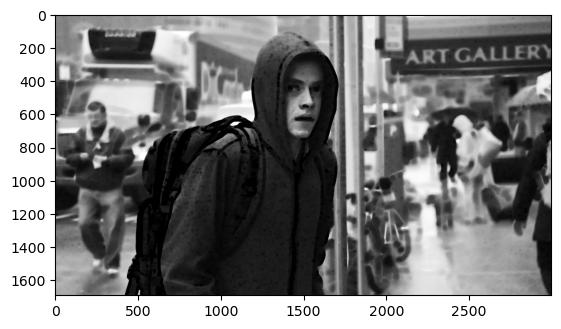

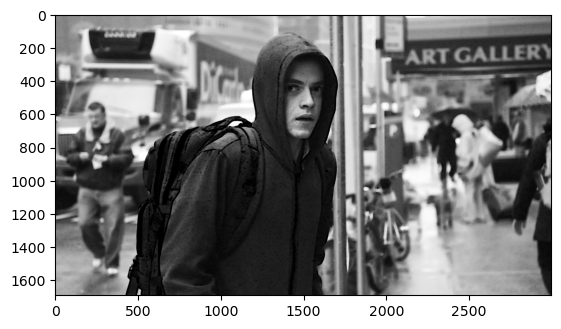

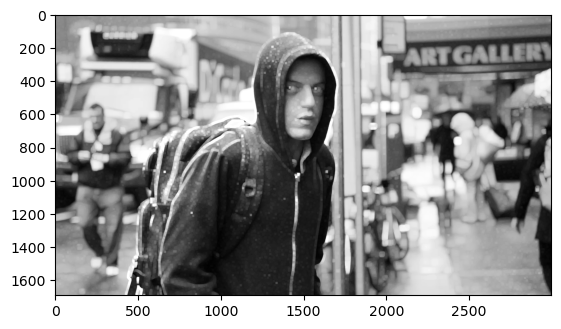

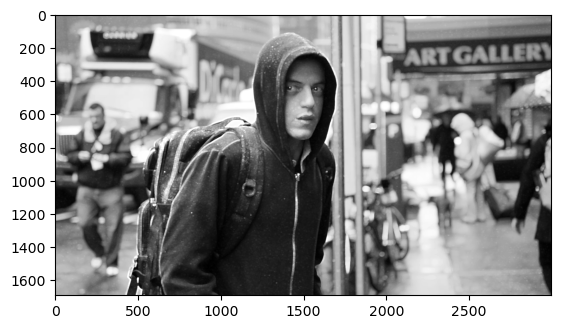

In [19]:
kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
print(kernel)
fig = gray_mrrobot
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

fig1 = cv2.erode(fig, kernel,iterations = 2)
fig2 = cv2.erode(fig, ellipse_kernel, iterations = 2)
fig3 = cv2.dilate(fig, rect_kernel,iterations = 2)
fig4= cv2.dilate(fig, ellipse_kernel, iterations = 2)


plt.imshow(fig1,cmap="gray")
plt.show()  
plt.imshow(fig2,cmap="gray")
plt.show()  
plt.imshow(fig3,cmap="gray")
plt.show() 
plt.imshow(fig4,cmap="gray")
plt.show() 

## Простори LoG та DoG 

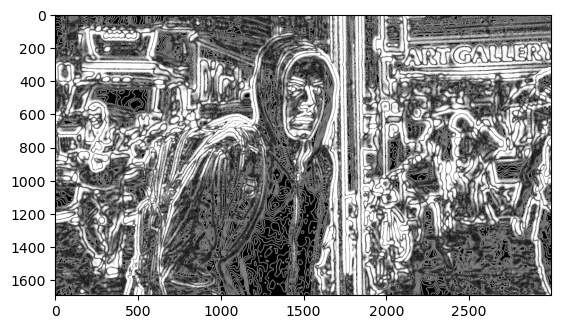

In [20]:
mrrobot_blur = cv2.GaussianBlur(gray_mrrobot,(45,45),0)
log = cv2.Laplacian(mrrobot_blur,ddepth=cv2.CV_16S,ksize=7)
log = cv2.convertScaleAbs(log)
plt.imshow(log, cmap='gray')
plt.show()

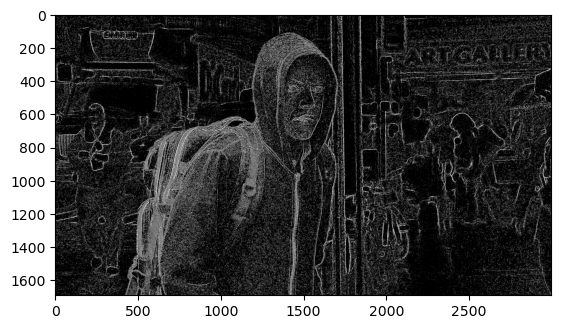

In [21]:
# Apply 3x3 and 7x7 Gaussian blur
low_sigma = cv2.GaussianBlur(gray_mrrobot,(3,3),0)
high_sigma = cv2.GaussianBlur(gray_mrrobot,(5,5),0)

# Calculate the DoG by subtracting
dog = low_sigma - high_sigma
plt.imshow(dog, cmap='gray')
plt.show()

# Фото 3
## Перетворення зображення

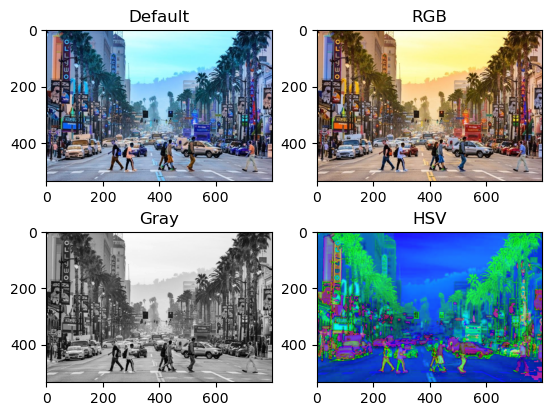

In [22]:
street=cv2.imread('street.jpg')
rgb_street = cv2.cvtColor(street, cv2.COLOR_BGR2RGB)
gray_street = cv2.cvtColor(street, cv2.COLOR_BGR2GRAY)
hsv_street = cv2.cvtColor(street, cv2.COLOR_BGR2HSV)
plt.subplot(2,2,1)
plt.title('Default')
plt.imshow(street)
plt.subplot(2,2,2)
plt.title('RGB')
plt.imshow(rgb_street)
plt.subplot(2,2,3)
plt.title('Gray')
plt.imshow(gray_street, cmap='gray')
plt.subplot(2,2,4)
plt.title('HSV')
plt.imshow(hsv_street)

## Гістограма зображення 

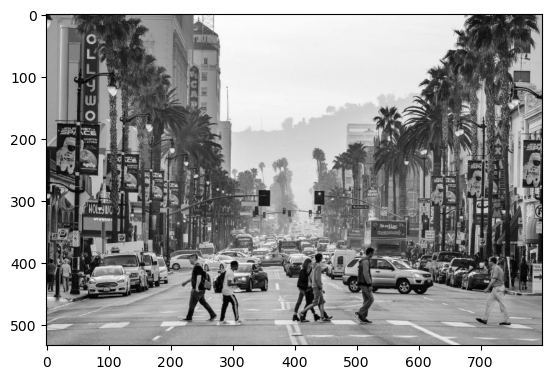

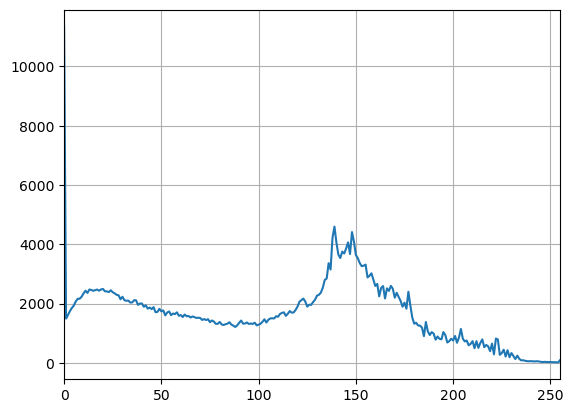

In [23]:
plt.imshow(gray_street, cmap='gray')
plt.show()
hist = cv2.calcHist([street], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

# Вирівнювання гістограми 

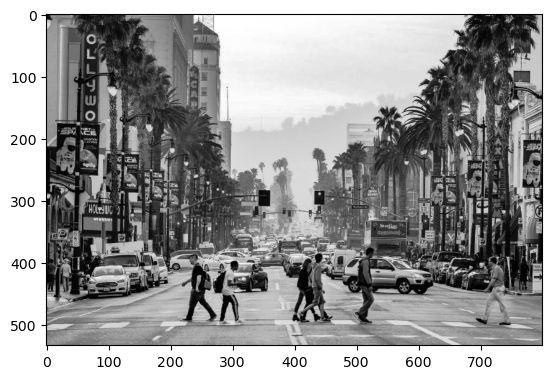

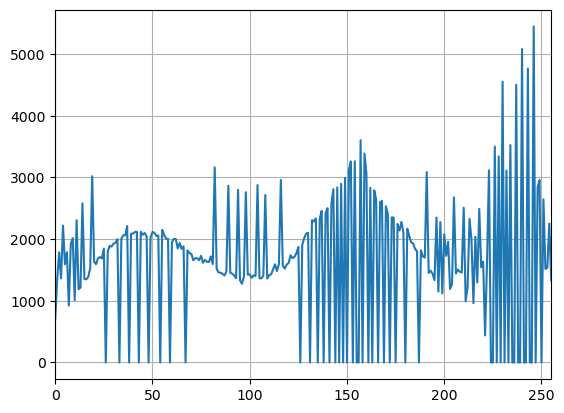

In [24]:
equ = cv2.equalizeHist(gray_street)
plt.imshow(equ,cmap='gray')
plt.show()
hist = cv2.calcHist([equ], [0], None, [256], [0, 256])
plt.plot(hist)
plt.xlim([0, 255])
plt.grid()
plt.show()

## Розмір зображення 

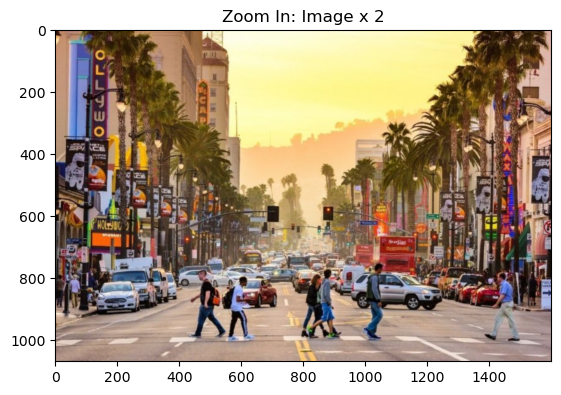

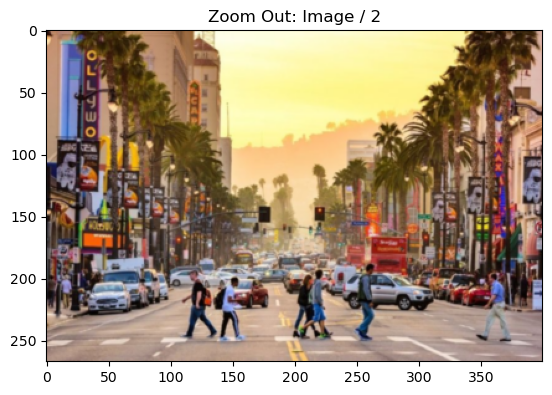

In [25]:
rows, cols, dot = map(int, street.shape)

street_size = cv2.pyrUp(rgb_street, dstsize=(2 * cols, 2 * rows))
plt.imshow(street_size)
plt.title('Zoom In: Image x 2')
plt.show()

street_size = cv2.pyrDown(rgb_street, dstsize=(cols // 2, rows // 2))
plt.imshow(street_size)
plt.title('Zoom Out: Image / 2')
plt.show()

## Гаусове згладжування 

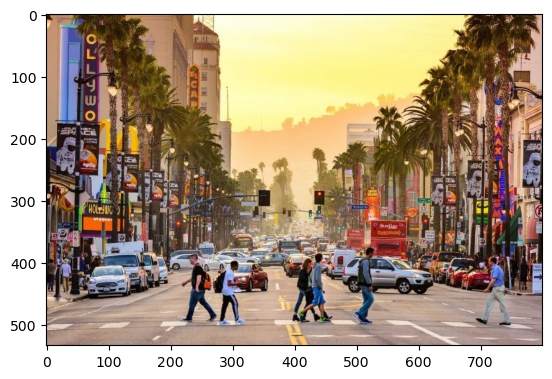

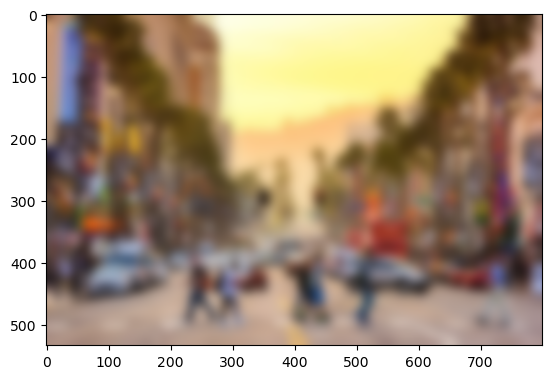

In [26]:
street_blur = cv2.GaussianBlur(rgb_street,(55,55),0)
plt.imshow(rgb_street)
plt.show()
plt.imshow(street_blur)
plt.show() 

## Порогова обробка 

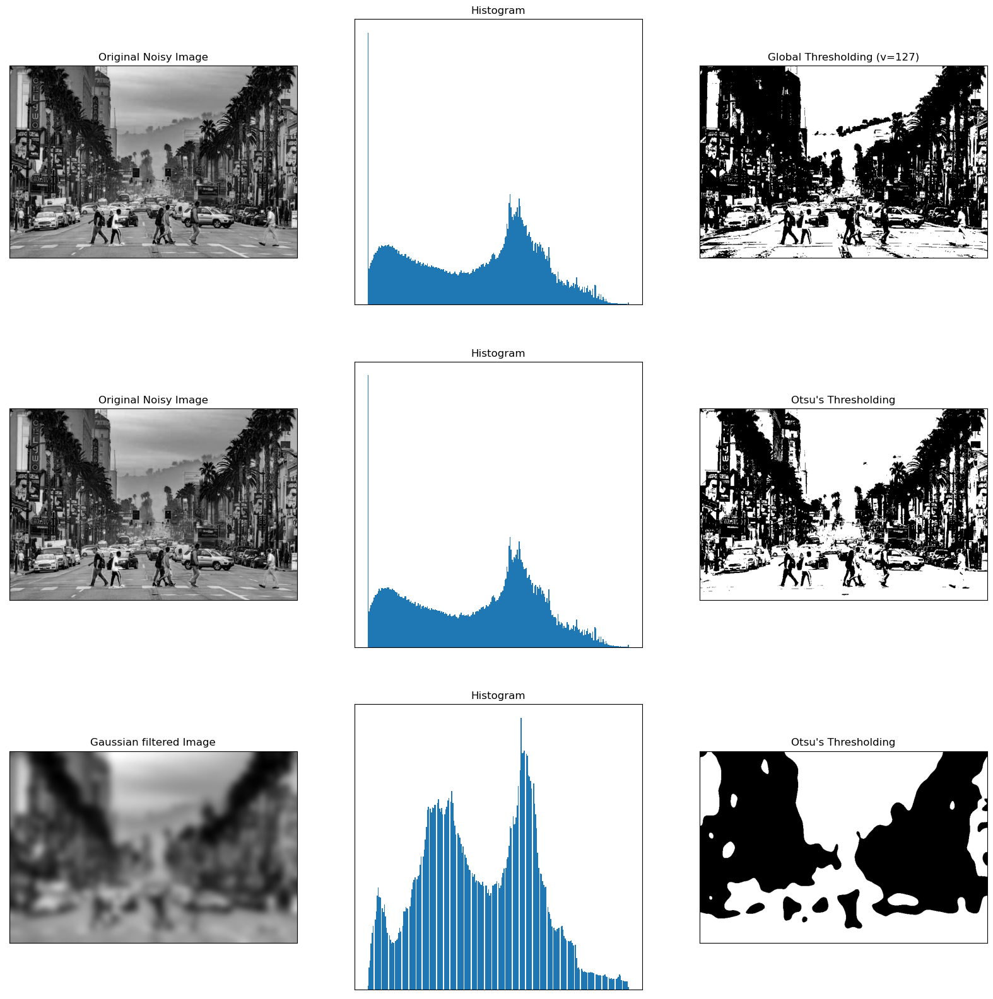

In [27]:
a, b, c = cv2.split(street)

# global thresholding
ret1,th1 = cv2.threshold(a,127,255,cv2.THRESH_BINARY)
# Otsu's thresholding
ret2,th2 = cv2.threshold(a,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(a,(65,65),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# plot all the images and their histograms
images = [a, 0, th1,
          a, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

plt.figure(figsize=(20,20))
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

## Масштабування та афінне перетворення 

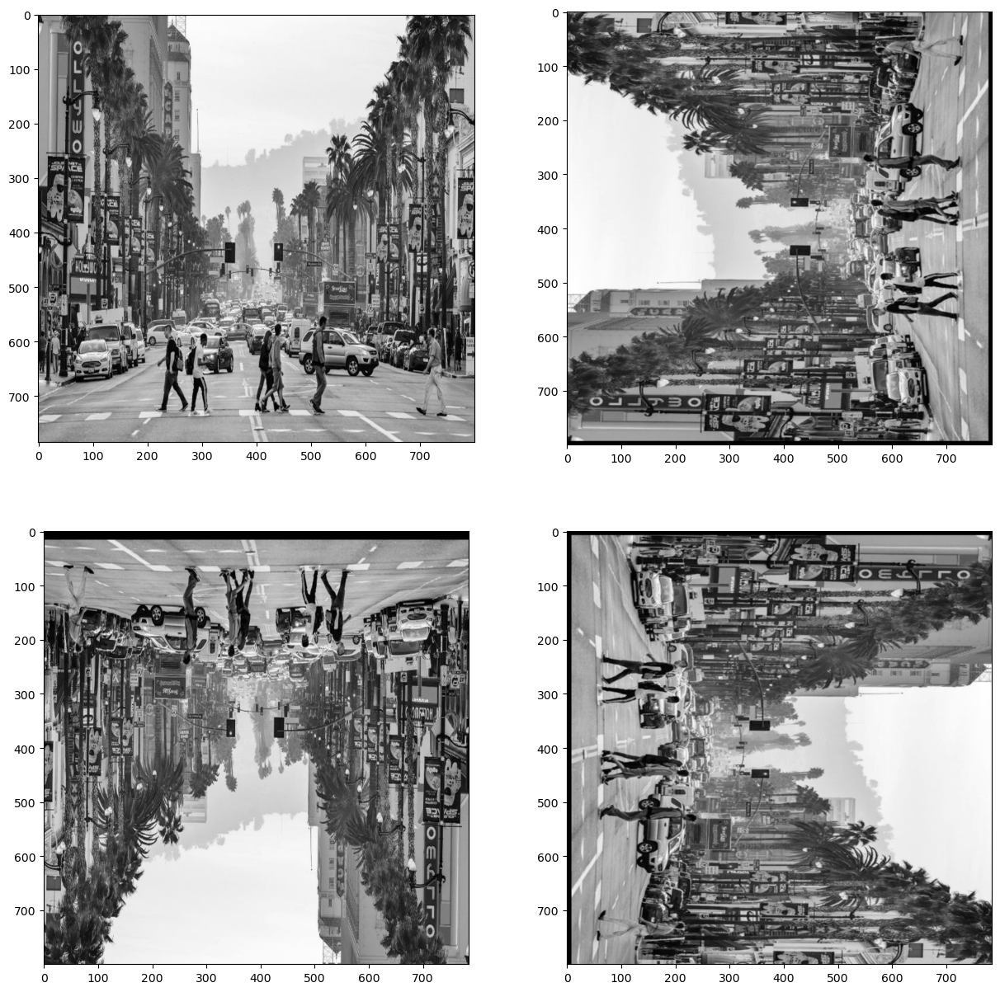

In [28]:
img = cv2.resize(gray_street,None,fx=1, fy=1.47, interpolation = cv2.INTER_CUBIC)
width=img.shape[0]
height=img.shape[1]
M90 = cv2.getRotationMatrix2D((width/2, height/2), 90, 1) 
M180 = cv2.getRotationMatrix2D((width/2, height/2), 180, 1) 
M270 = cv2.getRotationMatrix2D((width/2, height/2), 270, 1) 
img_rot90 = cv2.warpAffine(img, M90, (width, height)) 
img_rot180 = cv2.warpAffine(img, M180, (width, height)) 
img_rot270 = cv2.warpAffine(img, M270, (width, height)) 
plt.figure(figsize = (15, 15)) 
plt.subplot(221) 
plt.imshow(img, cmap='gray') 
plt.subplot(222) 
plt.imshow(img_rot90, cmap='gray') 
plt.subplot(223) 
plt.imshow(img_rot180, cmap='gray') 
plt.subplot(224) 
plt.imshow(img_rot270, cmap='gray') 
plt.show()

## Ерозія та дилація 

[[0 0 0 0 1 0 0 0 0]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [0 0 0 0 1 0 0 0 0]]


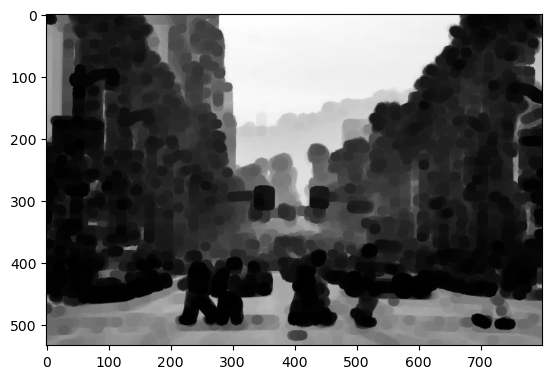

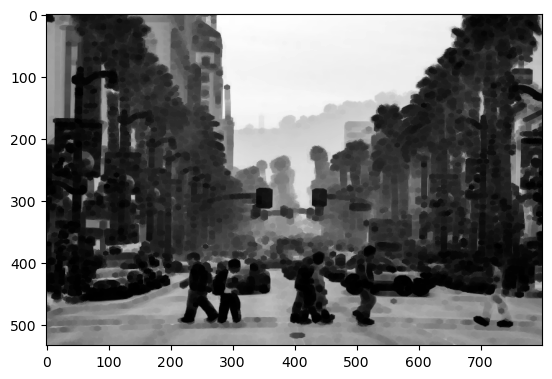

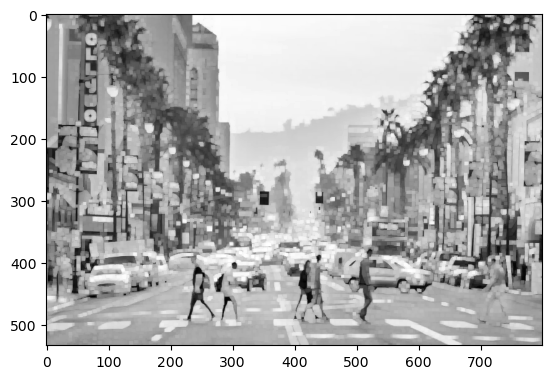

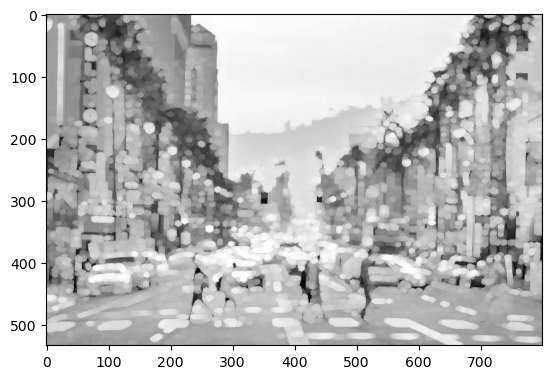

In [29]:
kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
print(kernel)
fig = gray_street
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

fig1 = cv2.erode(fig, kernel,iterations = 2)
fig2 = cv2.erode(fig, ellipse_kernel, iterations = 2)
fig3 = cv2.dilate(fig, rect_kernel,iterations = 2)
fig4= cv2.dilate(fig, ellipse_kernel, iterations = 2)


plt.imshow(fig1,cmap="gray")
plt.show()  
plt.imshow(fig2,cmap="gray")
plt.show()  
plt.imshow(fig3,cmap="gray")
plt.show() 
plt.imshow(fig4,cmap="gray")
plt.show() 

## Простори LoG та DoG 

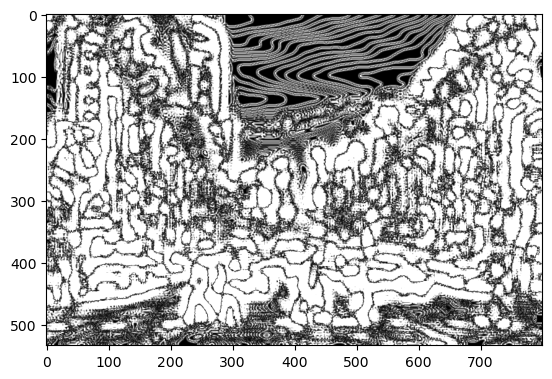

In [30]:
street_blur = cv2.GaussianBlur(gray_street,(45,45),0)
log = cv2.Laplacian(street_blur,ddepth=cv2.CV_16S,ksize=7)
log = cv2.convertScaleAbs(log)
plt.imshow(log, cmap='gray')
plt.show()

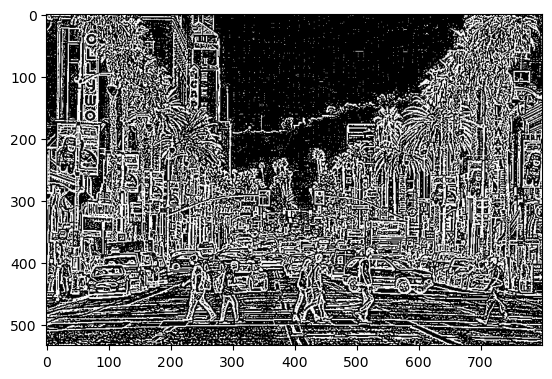

In [31]:
# Apply 3x3 and 7x7 Gaussian blur
low_sigma = cv2.GaussianBlur(gray_street,(3,3),0)
high_sigma = cv2.GaussianBlur(gray_street,(5,5),0)

# Calculate the DoG by subtracting
dog = low_sigma - high_sigma
plt.imshow(dog, cmap='gray')
plt.show()

# Висновки

В даній роботі було розглянуто різні методи та засоби обробки зображень з використанням бібліотеки OpenCV для Python - бібліотеки з відкритим кодом, яка призначена для аналізу, класифікації та обробки зображень на трьох обраних фото. Після вирівнювання гістограми зображення стало більш "збалансованим" особливо це видно на третій фотографії з видом з вулиці, стало краще видно деталі на небі та контури, а ще збільшилась контрасність.
Гаусове зглажування робить зображення менш чітким, розмиває контури, видаляє шуми.

Вирівнювання гістограми – це комп'ютерна технологія обробки зображень, яка використовується для покращення контрастності зображень. Це досягається шляхом ефективного розподілу найчастіших значень інтенсивності, тобто розширення діапазону інтенсивності зображення. Цей метод зазвичай збільшує загальний контраст зображень, коли його дані представлені близькими значеннями контрастності. Це дозволяє областям з нижчим локальним контрастом отримати більш високий контраст.

Гаусове згладжування - це спосіб розмиття зображення за допомогою функції Гауса. Цей ефект використовується для зменшення шуму зображення та зниження деталізації. Мета згладжування зображення - усунення «викидів», які вважаються шумом.

Порогової обробка - один з основних та простих способів сегментації. Сегментація - розділення зображення на області, для яких виконується певний критерій однорідності. Поріг - це ознака (властивість), яка допомагає розділити шуканий сигнал на класи. Операція порогової обробки полягає у зіставленні значення яскравості кожного пікселя зображення із заданим значенням порога.

Піраміда - стандартна структура даних для представлення зображення в різних розмірах. Вихідне зображення знаходиться в основі піраміди, а зображення менших розмірів на наступних рівнях.

Афінне перетворення-це функціональне відображення між двома геометричними (афінними) просторами, які зберігають точки, прямі та паралельні лінії, а також відносини між точками. Тобто іншими словами, це допомогаю нам обертати наше зображення на необхідний нам вугол.

Ерозія зображення - видаляє білі шуми і зменшує вихідний об'єкт. Вона працює таким чином, що у нас є структурний елемент, що являє собою деяке двійкове зображення певної форми, зазвичай розміром 3х3 чи 5х5. Цей об'єкт ковзає по нашому зображенню та на виходному зображенні повертає одиницю тільки якщо всі всі пікселі під структурним елементом дорівнюють 1, інакше він стає рівним нулю.

Дилація зображення - збільшує білу область на зображенні або збільшує розмір об’єкта переднього плану. Вона працює таким чином, що у нас є структурний елемент, що являє собою деяке двійкове зображення певної форми, зазвичай розміром 3х3 чи 5х5. Цей об'єкт ковзає по нашому зображенню та на виходному зображенні повертає одиницю якщо хоча б один піксель під структурованим елементом дорівнює 1, а інакше 0.
В своїй роботі я вирішив подивитись на різні значення для ядра для всіх зображень, були розглянуті 2х2, 3х3, 5х5, 7х7, 9х9. Можна стверджувати, що при збільшені розміру ядра має місце поступове розмиття зображення.

Простори LoG та DoG можна використовути для знаходження країв об'єктів.